In [1]:
import matplotlib.pyplot as plt
import numpy as np
#import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import Input, Dense, Flatten, Reshape, Dropout, LeakyReLU, ReLU, LayerNormalization, GaussianNoise
#from tensorflow.keras.layers import BatchNormalization
from tensorflow.compat.v1.keras.layers import BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from keras.layers.core import Activation, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose, MaxPooling2D
from keras import initializers
from math import ceil
import time
from tensorflow_addons.layers import SpectralNormalization

In [2]:
#Updated Versions
#Spectral Normalization Model
def build_cifar10_discriminator(image_shape=(32, 32, 3)):
    
    model = Sequential()
    
    #16 output filters, so number of channels jumps from 1 to 16
    #kernel_size = 5 means we use a 5x5 convolution window
    #strides defaults to (1,1) when unspecified, "same" padding means we'll preserve the image size
    model.add(Conv2D(16, kernel_size=5, strides=2, padding="same", input_shape=(32, 32, 3), 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))) #40
    model.add(LeakyReLU(0.2))
    model.add(SpectralNormalization(Conv2D(32, kernel_size=5, strides=2, padding="same", 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(0.2))
    
    #Second layer
    model.add(SpectralNormalization(Conv2D(64, kernel_size=5, strides=2, padding="same", 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(0.2))
    model.add(SpectralNormalization(Conv2D(128, kernel_size=5, strides=2, padding="same", 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(0.2))

    #Flatten for Final Output Layer
    model.add(Flatten())

    #Output layer
    model.add(Dense(1, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(Activation("sigmoid"))
    
    #Final Output
    print("\nDiscriminator")
    model.summary()
    return model




#Spectral Normalization Model
def build_cifar10_generator(z_dim=100):
    
    model = Sequential()
    
    #First Layer (4x4)
    model.add(Dense(4*4*128, input_dim=z_dim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(Reshape((4,4,128)))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2))
    
    # upsample to 8x8
    model.add(SpectralNormalization(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', 
                              use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(alpha=0.2))
    
    # upsample to 16x16
    model.add(SpectralNormalization(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', 
                              use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(alpha=0.2))
    
    # upsample to 32x32
    model.add(Conv2DTranspose(3, kernel_size=5, strides=2, padding='same',
          use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    
    # output layer
    model.add(Activation('tanh'))

    print("\nGenerator")
    model.summary()
    return model




#Build and Compile Networks
#Variables
#Loss Functions:  Don't seem to matter for performance, any choice will work
#Learning rates:  Trying higher learning rate for Discriminator;  
#Discriminator is easier to succeed, gives generator a better chance at competition, prevents mode collapse
lr_d=2e-4
lr_g=1e-4
z_dim=100
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
image_shape = X_train[0].shape

D = build_cifar10_discriminator(image_shape)
G = build_cifar10_generator(z_dim)

D.compile(Adam(learning_rate=lr_d, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])
D.trainable = False

z = Input(shape=(z_dim, ))
D_of_G = Model(inputs=z, outputs=D(G(z)))
D_of_G.compile(Adam(learning_rate=lr_g, beta_1=0.5), loss='binary_crossentropy', metrics=['binary_accuracy'])


Discriminator
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 16)        1216      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16, 16, 16)        0         
                                                                 
 spectral_normalization (Spe  (None, 8, 8, 32)         12864     
 ctralNormalization)                                             
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 8, 8, 32)          0         
                                                                 
 spectral_normalization_1 (S  (None, 4, 4, 64)         51328     
 pectralNormalization)                                           
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 4, 4,

In [3]:
#Function for plotting images
def plot_images(images, filename):
    h, w, c = images.shape[1:]
    #images = (1/(2*2.25)) * images + 0.5
    images = 0.5 * images + 0.5
    grid_size = ceil(np.sqrt(images.shape[0]))
    images = (images.reshape(grid_size, grid_size, h, w, c)
              .transpose(0, 2, 1, 3, 4)
              .reshape(grid_size*h, grid_size*w, c))
    plt.figure(figsize=(16, 16))
    plt.imsave(filename, images)
    
#Function for Plotting Losses During Training
def plot_losses(losses_d, losses_g, filename):
    fig, axes = plt.subplots(1, 2, figsize=(8, 2))
    axes[0].plot(losses_d)
    axes[1].plot(losses_g)
    axes[0].set_title("losses_d")
    axes[1].set_title("losses_g")
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    #plt.close()
    
#Functions for smoothing labels of 1 and 0
# Smoothing class=1 to [0.8, 1.0]
def smooth_positive_labels(y):
    return y - 0.2 + (np.random.random(y.shape) * 0.2)

# Smoothing class=0 to [0.0, 0.1]
def smooth_negative_labels(y):
    return y + (np.random.random(y.shape) * 0.1)

#Function for generating latent points to feed into generator
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
     x_input = np.random.randn(latent_dim * n_samples)
     # reshape into a batch of inputs for the network
     x_input = x_input.reshape((n_samples, latent_dim))
     return x_input
    

#Function for adding noise to images
#  Adding noise to images prevents discriminator overfitting, inhibits performance to allow
#   for better rivalry with the generator (which is generally slower to train)
#This function adds 'salt and pepper noise' (randomly set pixels to either -1 or 1) 
# def noisy(image):
#     row,col,ch = image.shape
#     s_vs_p = 0.5
#     amount = 0.004
#     out = np.copy(image)
#     # Salt mode
#     num_salt = np.ceil(amount * image.size * s_vs_p)
#     coords = tuple([np.random.randint(0, i - 1, int(num_salt))
#             for i in image.shape])
#     out[coords] = 1

#     # Pepper mode
#     num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
#     coords = tuple([np.random.randint(0, i - 1, int(num_pepper))
#             for i in image.shape])
#     out[coords] = -1
#     return out

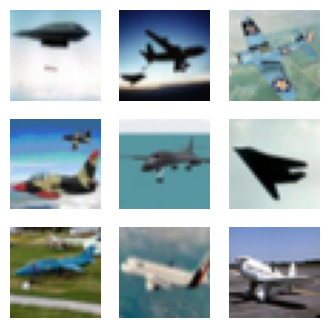

In [4]:
# #Test only grabbing images of one type

#Load the CIFAR10 data
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
#Concatenate X_train and X_test for more data
X_train = np.concatenate((X_train,X_test))
y_train = np.concatenate((y_train,y_test))
#Only use index 1, AKA cars
index = np.where(y_train.reshape(-1) == 0)
X_train = X_train[index]
y_train = y_train[index]

#Testing to make sure it's just airplanes
fig,axs = plt.subplots(3,3,figsize=(4,4),sharey=True,sharex=True)
cnt=0
for i in range(3):
    for j in range(3):
        axs[i, j].imshow(X_train[-9:][cnt,:,:])
        axs[i, j].axis('off')
        cnt+=1

image shape (32, 32, 3), min val -0.9843137264251709, max val 0.9921568632125854
Epoch 0
Time for epoch:  27.687260150909424
loss_d=0.33888, loss_g=2.24277
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


<Figure size 1600x1600 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

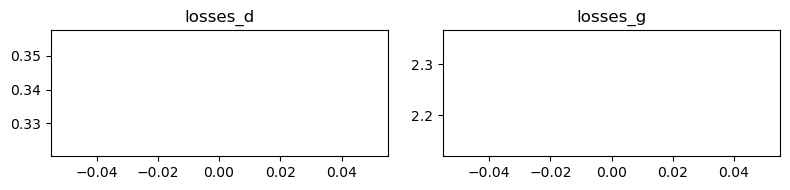

Epoch 1
Time for epoch:  25.246337890625
Epoch 2
Time for epoch:  25.199355602264404
loss_d=0.50625, loss_g=1.70809
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


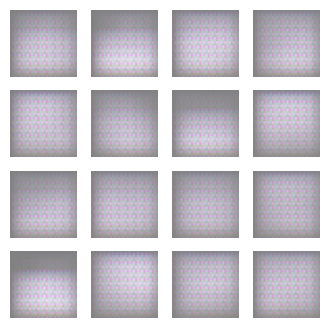

<Figure size 1600x1600 with 0 Axes>

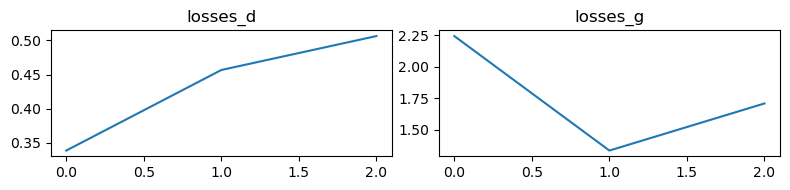

Epoch 3
Time for epoch:  25.039191007614136
Epoch 4
Time for epoch:  25.04983615875244
loss_d=0.51774, loss_g=1.15031
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


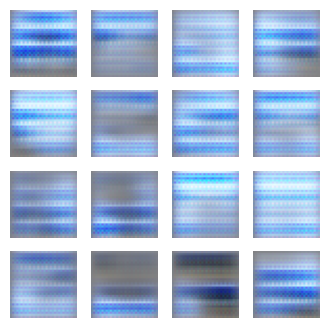

<Figure size 1600x1600 with 0 Axes>

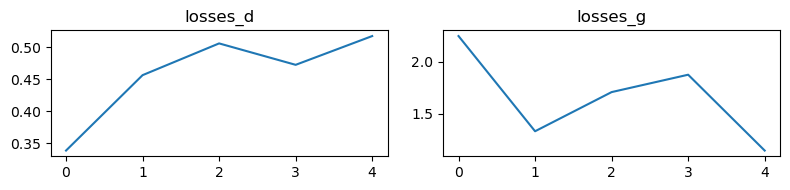

Epoch 5
Time for epoch:  26.217339277267456
Epoch 6
Time for epoch:  26.57288360595703
loss_d=0.43814, loss_g=1.28693
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


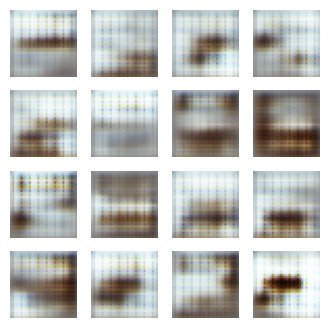

<Figure size 1600x1600 with 0 Axes>

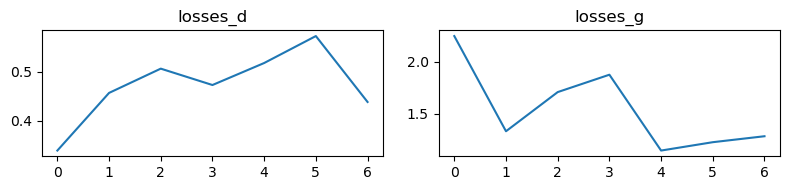

Epoch 7
Time for epoch:  26.62650489807129
Epoch 8
Time for epoch:  24.100778579711914
loss_d=0.49526, loss_g=1.20327
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


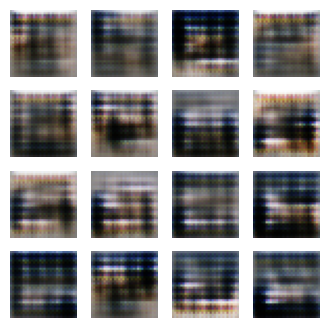

<Figure size 1600x1600 with 0 Axes>

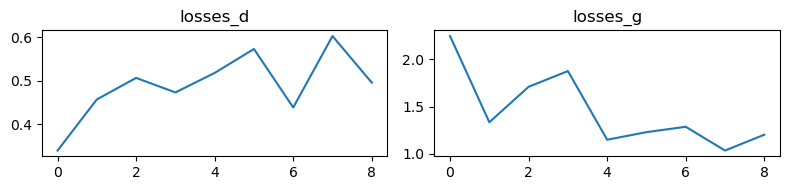

Epoch 9
Time for epoch:  25.146549224853516
Epoch 10
Time for epoch:  27.279375314712524
loss_d=0.66325, loss_g=1.14261
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


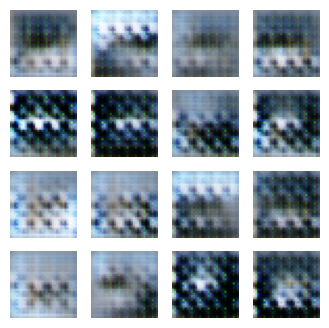

<Figure size 1600x1600 with 0 Axes>

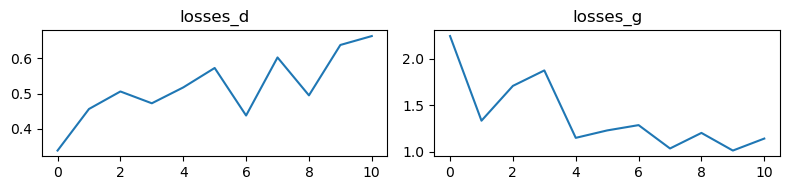

Epoch 11
Time for epoch:  25.00182604789734
Epoch 12
Time for epoch:  23.91294240951538
loss_d=0.55017, loss_g=1.05925
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


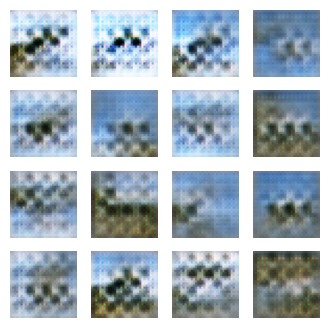

<Figure size 1600x1600 with 0 Axes>

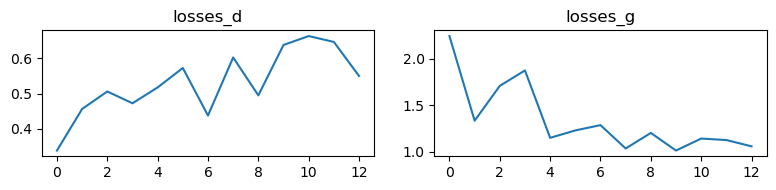

Epoch 13
Time for epoch:  24.142199993133545
Epoch 14
Time for epoch:  24.91304659843445
loss_d=0.58185, loss_g=1.17835
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


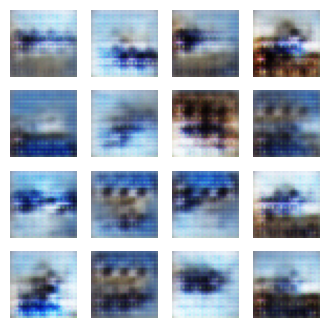

<Figure size 1600x1600 with 0 Axes>

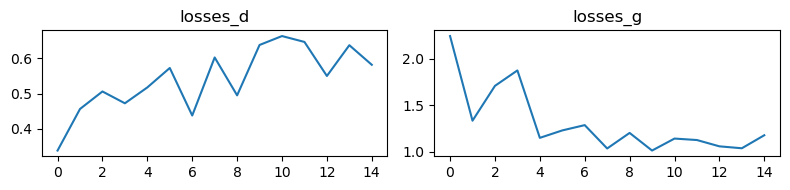

Epoch 15
Time for epoch:  25.673252820968628
Epoch 16
Time for epoch:  24.743449926376343
loss_d=0.53828, loss_g=1.17765
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


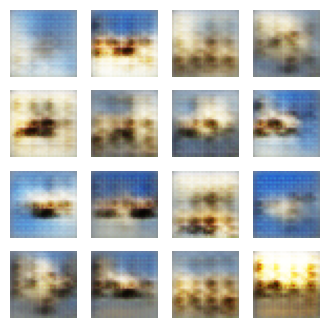

<Figure size 1600x1600 with 0 Axes>

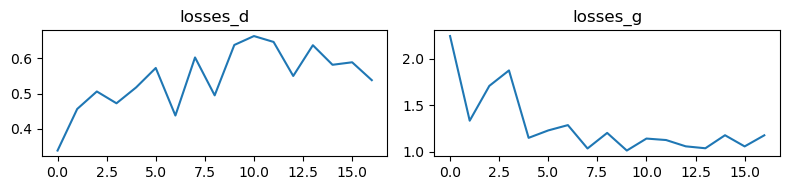

Epoch 17
Time for epoch:  24.706772804260254
Epoch 18
Time for epoch:  23.934194564819336
loss_d=0.55848, loss_g=1.12567
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


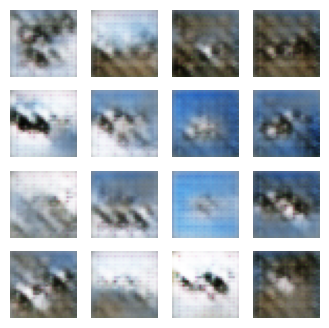

<Figure size 1600x1600 with 0 Axes>

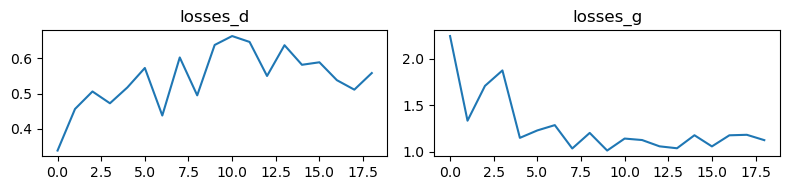

Epoch 19
Time for epoch:  24.937331438064575
Epoch 20
Time for epoch:  24.397796392440796
loss_d=0.63171, loss_g=1.10192
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


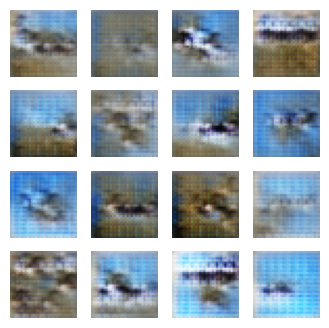

<Figure size 1600x1600 with 0 Axes>

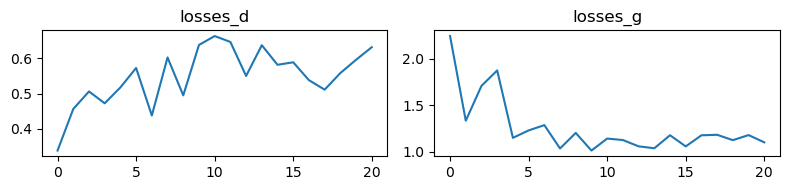

Epoch 21
Time for epoch:  25.57218360900879
Epoch 22
Time for epoch:  24.105628967285156
loss_d=0.56373, loss_g=1.38542
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


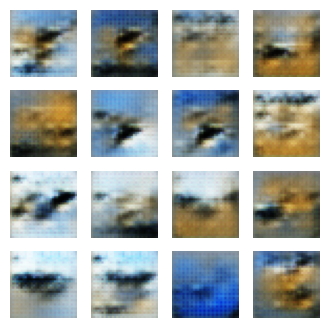

<Figure size 1600x1600 with 0 Axes>

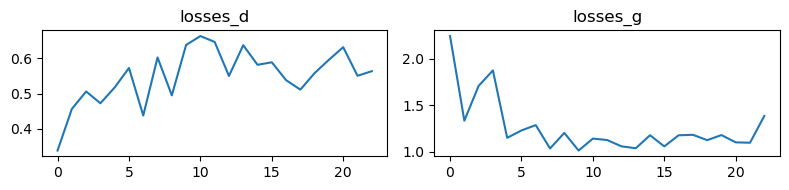

Epoch 23
Time for epoch:  23.719985485076904
Epoch 24
Time for epoch:  24.824716806411743
loss_d=0.46693, loss_g=1.44831
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


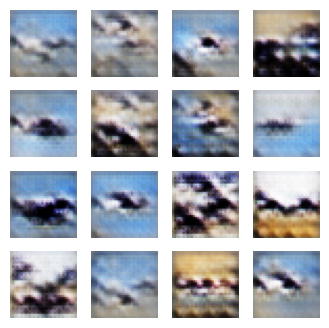

<Figure size 1600x1600 with 0 Axes>

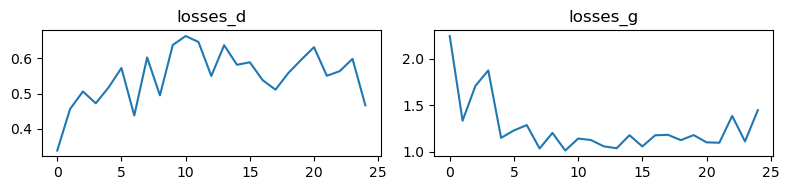

Epoch 25
Time for epoch:  24.774445056915283
Epoch 26
Time for epoch:  23.84447717666626
loss_d=0.50232, loss_g=1.29053
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


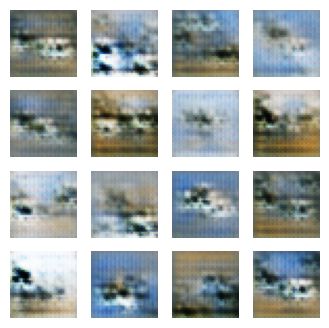

<Figure size 1600x1600 with 0 Axes>

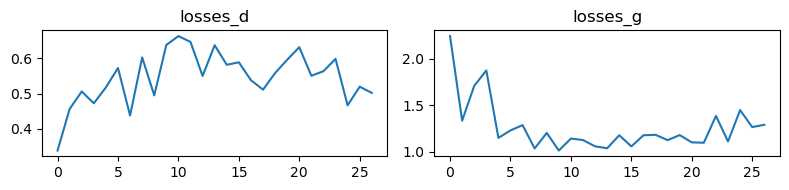

Epoch 27
Time for epoch:  24.641830444335938
Epoch 28
Time for epoch:  24.498008251190186
loss_d=0.69001, loss_g=1.36299
2/2 [==============================] - 0s 6ms/step
	Plotting images and losses


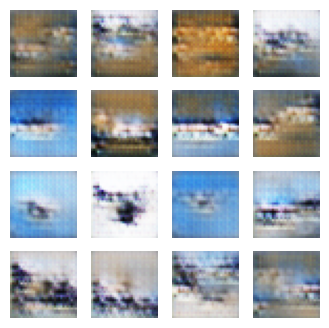

<Figure size 1600x1600 with 0 Axes>

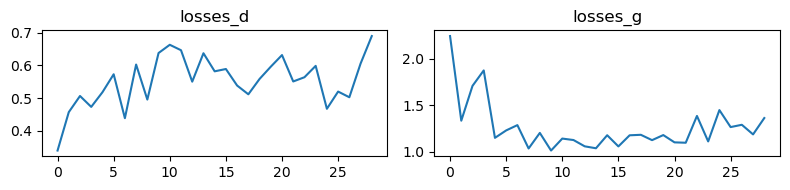

Epoch 29
Time for epoch:  24.928282022476196
Epoch 30
Time for epoch:  24.37853717803955
loss_d=0.58362, loss_g=1.23988
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


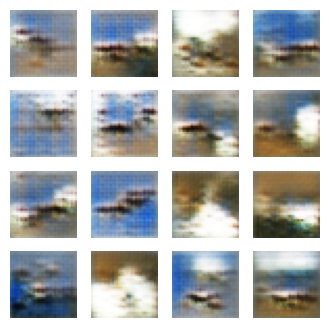

<Figure size 1600x1600 with 0 Axes>

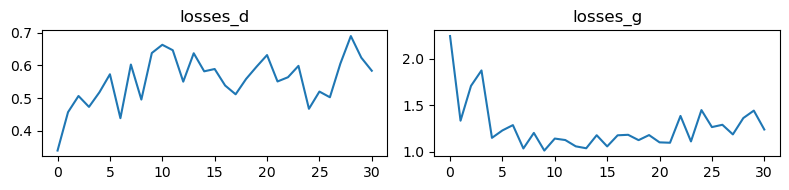

Epoch 31
Time for epoch:  24.47901439666748
Epoch 32
Time for epoch:  24.457826375961304
loss_d=0.46335, loss_g=1.28727
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


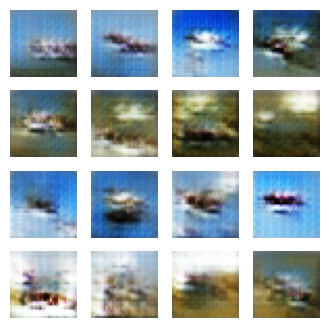

<Figure size 1600x1600 with 0 Axes>

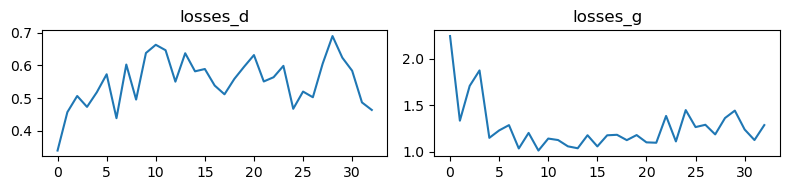

Epoch 33
Time for epoch:  23.7324640750885
Epoch 34
Time for epoch:  24.515910387039185
loss_d=0.62311, loss_g=1.73902
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


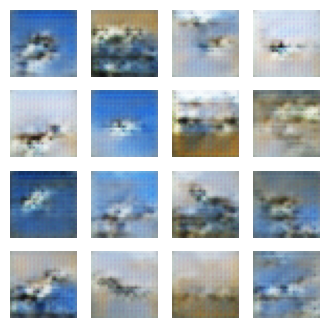

<Figure size 1600x1600 with 0 Axes>

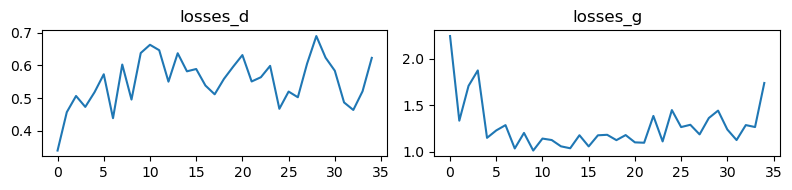

Epoch 35
Time for epoch:  24.89588499069214
Epoch 36
Time for epoch:  23.71489453315735
loss_d=0.61935, loss_g=1.17509
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


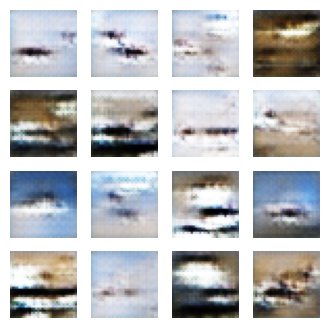

<Figure size 1600x1600 with 0 Axes>

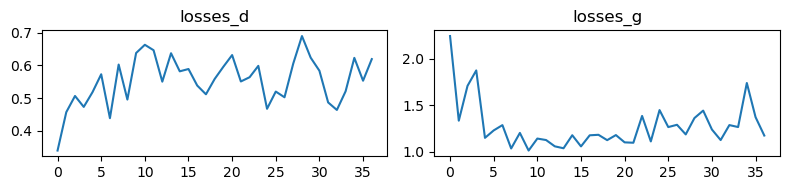

Epoch 37
Time for epoch:  23.97277808189392
Epoch 38
Time for epoch:  24.09733247756958
loss_d=0.59923, loss_g=1.27497
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


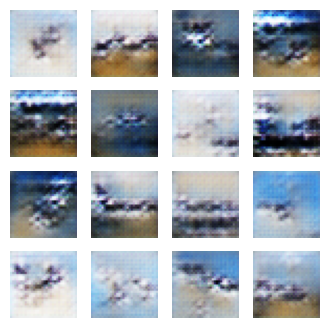

<Figure size 1600x1600 with 0 Axes>

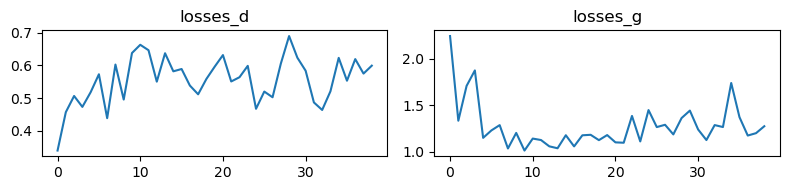

Epoch 39
Time for epoch:  24.222790956497192
Epoch 40
Time for epoch:  24.90752601623535
loss_d=0.49254, loss_g=1.42461
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


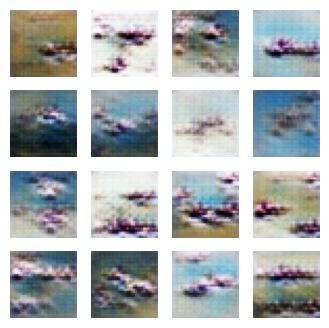

<Figure size 1600x1600 with 0 Axes>

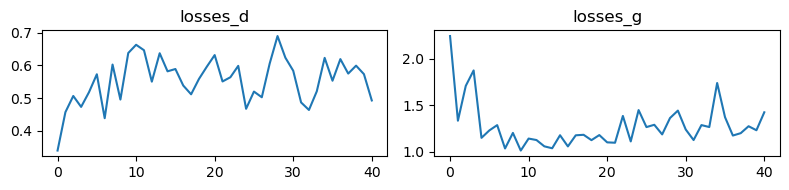

Epoch 41
Time for epoch:  25.188601970672607
Epoch 42
Time for epoch:  24.78675866127014
loss_d=0.53720, loss_g=1.28645
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


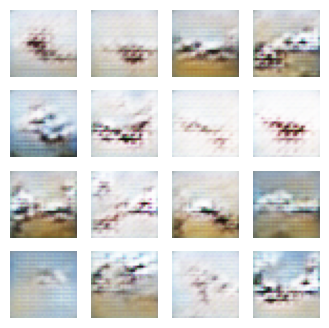

<Figure size 1600x1600 with 0 Axes>

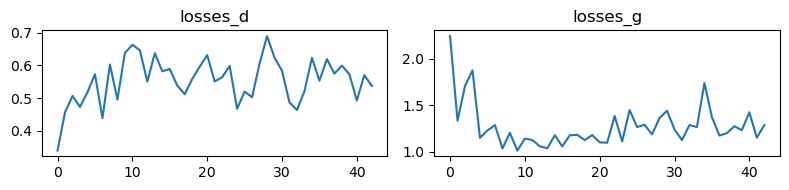

Epoch 43
Time for epoch:  24.05449938774109
Epoch 44
Time for epoch:  23.66452670097351
loss_d=0.53947, loss_g=1.13753
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


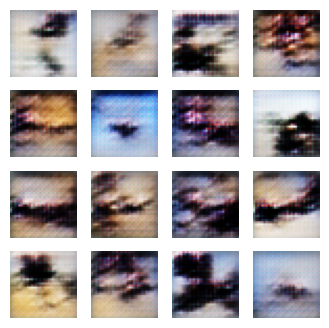

<Figure size 1600x1600 with 0 Axes>

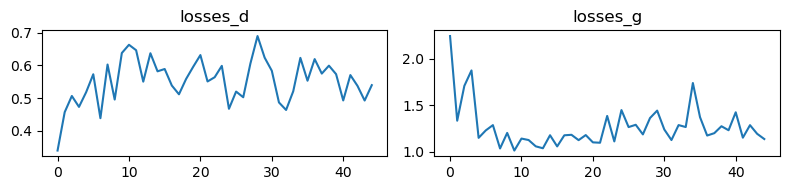

Epoch 45
Time for epoch:  24.05303406715393
Epoch 46
Time for epoch:  24.03456711769104
loss_d=0.56838, loss_g=1.18025
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


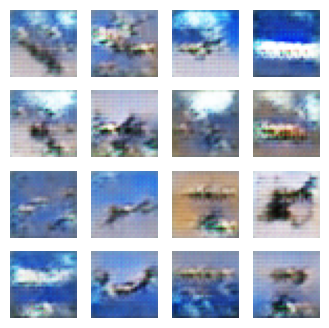

<Figure size 1600x1600 with 0 Axes>

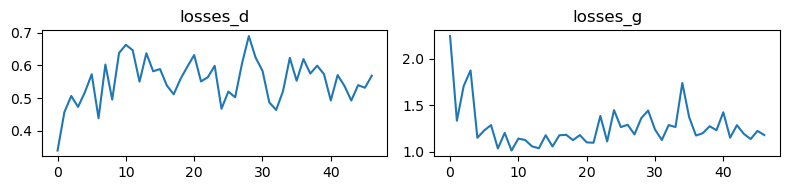

Epoch 47
Time for epoch:  24.092303037643433
Epoch 48
Time for epoch:  23.793649911880493
loss_d=0.50850, loss_g=1.22183
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


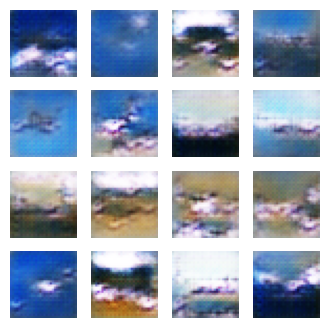

<Figure size 1600x1600 with 0 Axes>

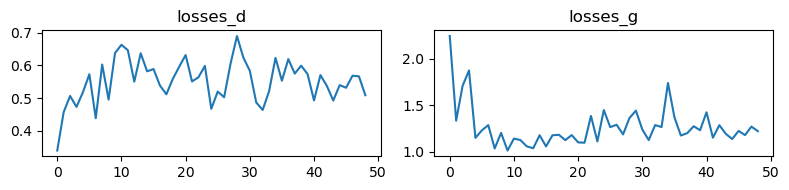

Epoch 49
Time for epoch:  24.097115516662598
Epoch 50
Time for epoch:  23.31655788421631
loss_d=0.66042, loss_g=1.11884
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


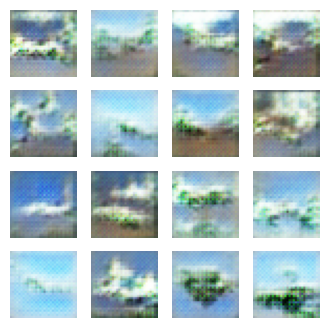

<Figure size 1600x1600 with 0 Axes>

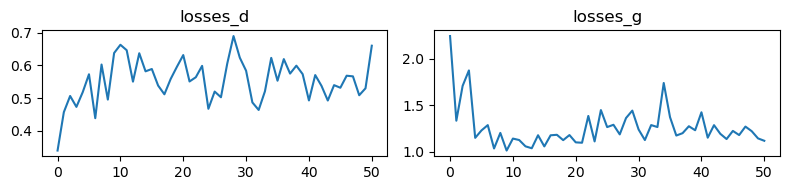

Epoch 51
Time for epoch:  23.53564977645874
Epoch 52
Time for epoch:  23.704407930374146
loss_d=0.55820, loss_g=1.22691
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


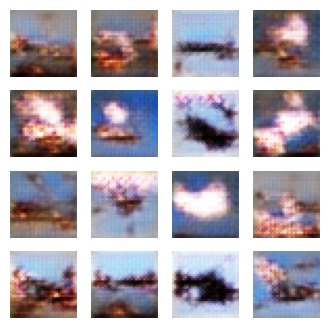

<Figure size 1600x1600 with 0 Axes>

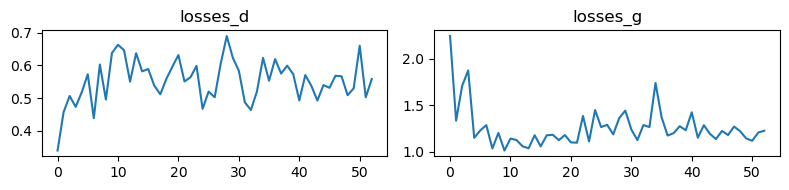

Epoch 53
Time for epoch:  23.44743037223816
Epoch 54
Time for epoch:  23.3906512260437
loss_d=0.52259, loss_g=1.09627
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


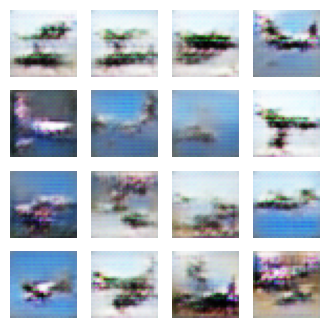

<Figure size 1600x1600 with 0 Axes>

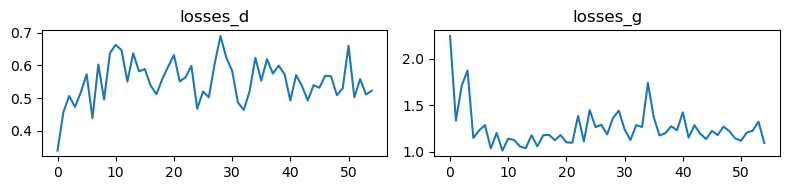

Epoch 55
Time for epoch:  23.318798303604126
Epoch 56
Time for epoch:  23.262202978134155
loss_d=0.58825, loss_g=1.08696
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


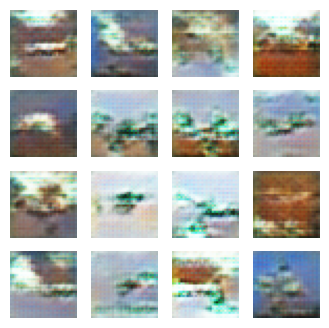

<Figure size 1600x1600 with 0 Axes>

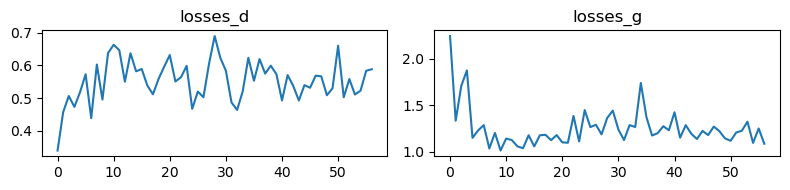

Epoch 57
Time for epoch:  23.399644374847412
Epoch 58
Time for epoch:  23.397589921951294
loss_d=0.54692, loss_g=1.09564
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


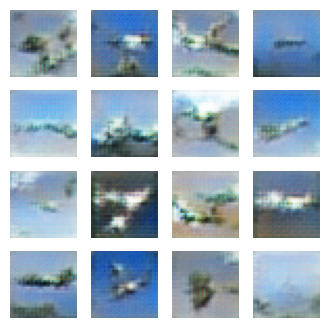

<Figure size 1600x1600 with 0 Axes>

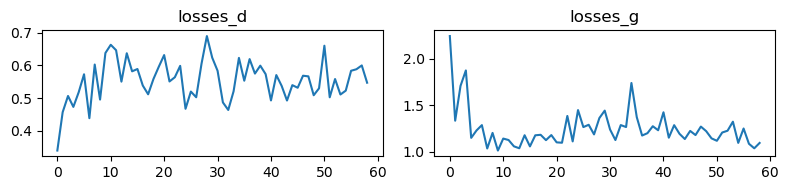

Epoch 59
Time for epoch:  23.44965434074402
Epoch 60
Time for epoch:  23.39557957649231
loss_d=0.67942, loss_g=1.16124
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


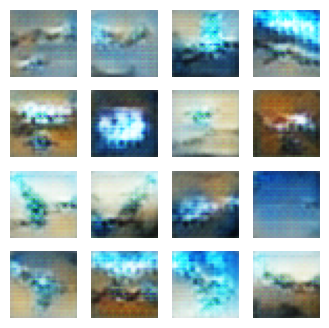

<Figure size 1600x1600 with 0 Axes>

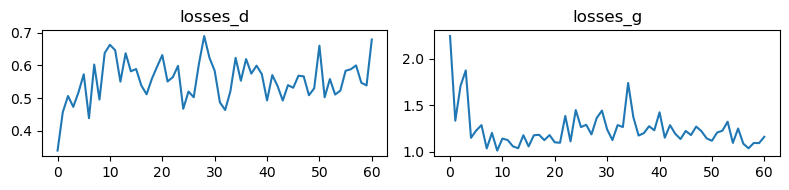

Epoch 61
Time for epoch:  23.358882427215576
Epoch 62
Time for epoch:  23.330573558807373
loss_d=0.55920, loss_g=1.19293
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


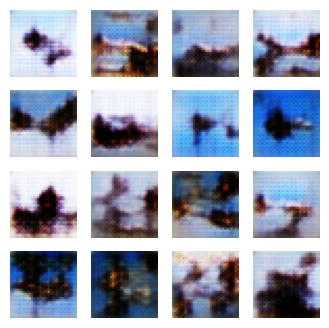

<Figure size 1600x1600 with 0 Axes>

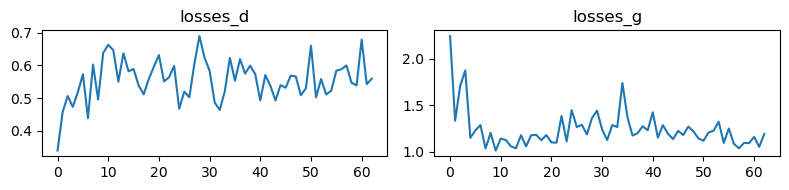

Epoch 63
Time for epoch:  23.507708311080933
Epoch 64
Time for epoch:  23.510363817214966
loss_d=0.56529, loss_g=1.16103
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


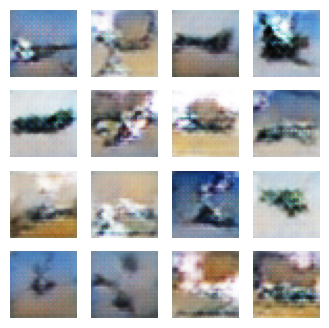

<Figure size 1600x1600 with 0 Axes>

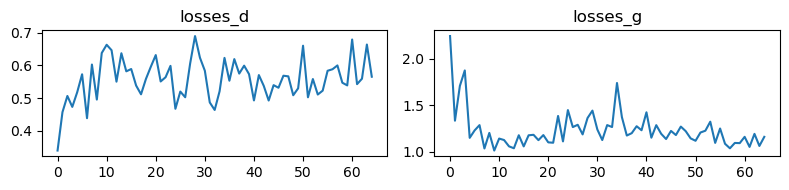

Epoch 65
Time for epoch:  23.43472194671631
Epoch 66
Time for epoch:  23.627912282943726
loss_d=0.54749, loss_g=1.11130
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


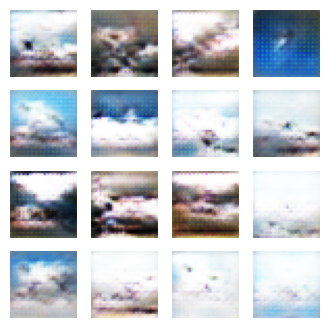

<Figure size 1600x1600 with 0 Axes>

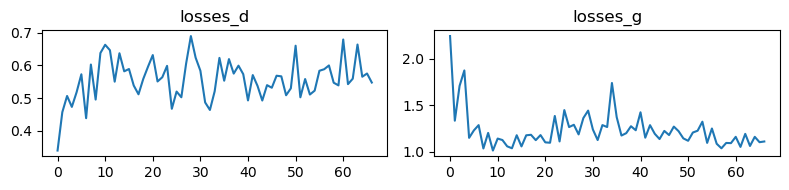

Epoch 67
Time for epoch:  23.31338405609131
Epoch 68
Time for epoch:  23.285428762435913
loss_d=0.55562, loss_g=1.13304
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


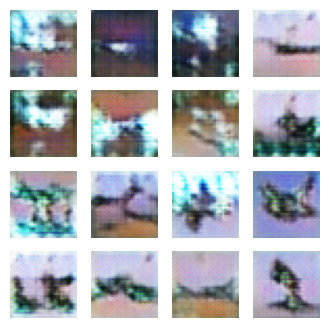

<Figure size 1600x1600 with 0 Axes>

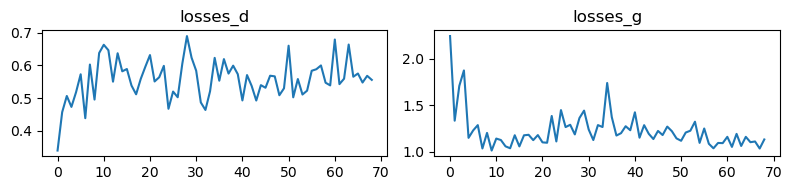

Epoch 69
Time for epoch:  23.477805852890015
Epoch 70
Time for epoch:  23.58909511566162
loss_d=0.57091, loss_g=1.10900
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


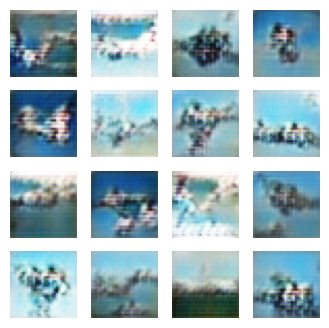

<Figure size 1600x1600 with 0 Axes>

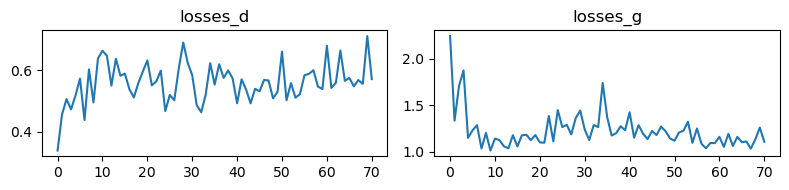

Epoch 71
Time for epoch:  23.36290192604065
Epoch 72
Time for epoch:  23.48822808265686
loss_d=0.63488, loss_g=0.94498
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


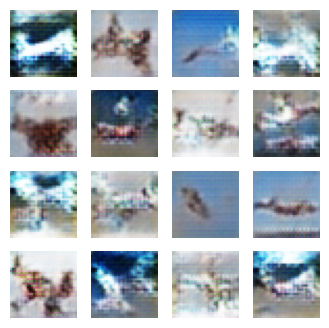

<Figure size 1600x1600 with 0 Axes>

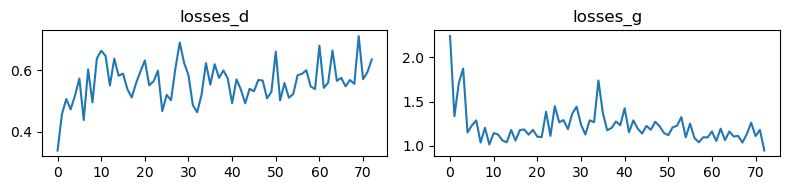

Epoch 73
Time for epoch:  23.350287675857544
Epoch 74
Time for epoch:  23.355461359024048
loss_d=0.57354, loss_g=1.03578
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


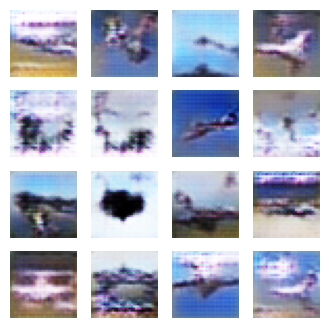

<Figure size 1600x1600 with 0 Axes>

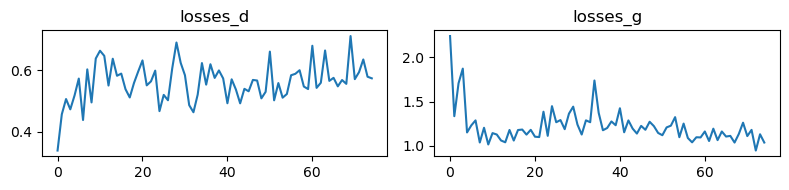

Epoch 75
Time for epoch:  23.658555269241333
Epoch 76
Time for epoch:  23.455716848373413
loss_d=0.58955, loss_g=1.10112
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


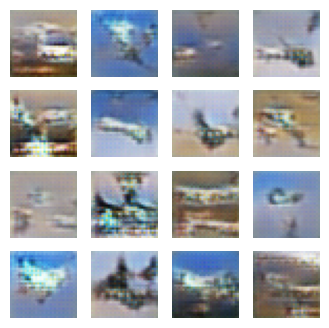

<Figure size 1600x1600 with 0 Axes>

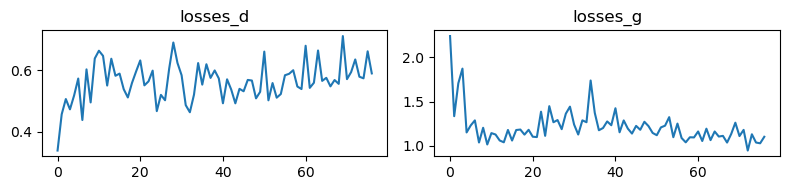

Epoch 77
Time for epoch:  23.359134674072266
Epoch 78
Time for epoch:  23.279623985290527
loss_d=0.64844, loss_g=1.12168
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


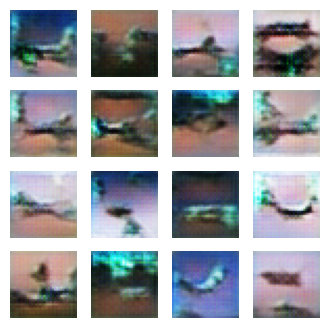

<Figure size 1600x1600 with 0 Axes>

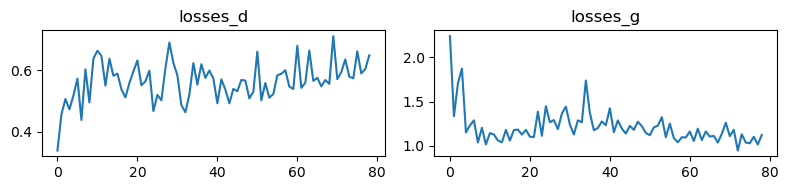

Epoch 79
Time for epoch:  23.387192010879517
Epoch 80
Time for epoch:  23.292102575302124
loss_d=0.58250, loss_g=0.99680
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


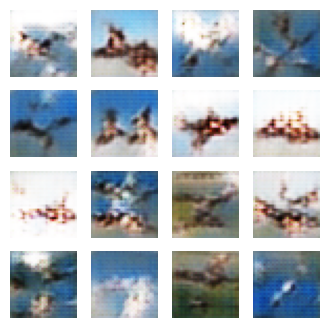

<Figure size 1600x1600 with 0 Axes>

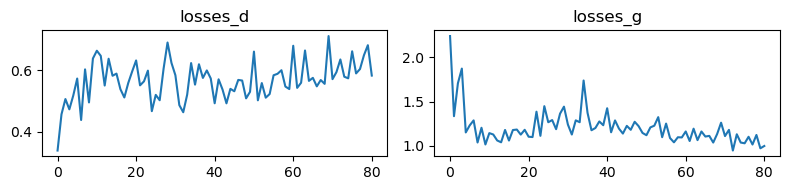

Epoch 81
Time for epoch:  23.34394645690918
Epoch 82
Time for epoch:  23.33299231529236
loss_d=0.62864, loss_g=1.03777
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


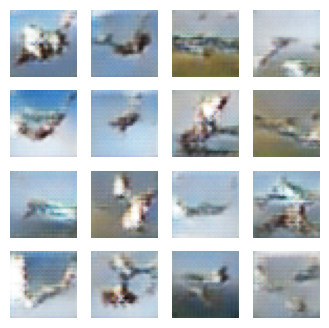

<Figure size 1600x1600 with 0 Axes>

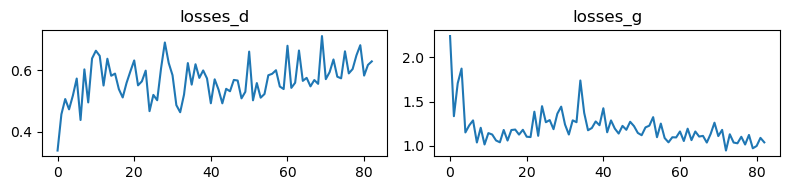

Epoch 83
Time for epoch:  23.26024341583252
Epoch 84
Time for epoch:  23.27388620376587
loss_d=0.56739, loss_g=1.08669
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


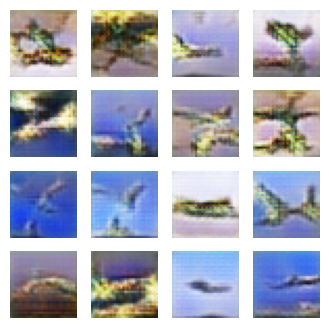

<Figure size 1600x1600 with 0 Axes>

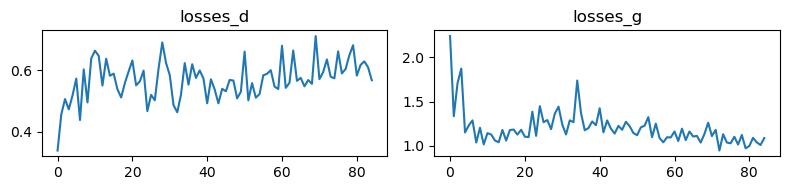

Epoch 85
Time for epoch:  23.245736837387085
Epoch 86
Time for epoch:  23.487066745758057
loss_d=0.59449, loss_g=1.05754
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


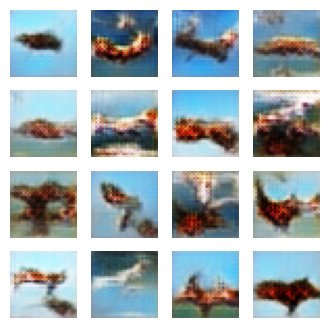

<Figure size 1600x1600 with 0 Axes>

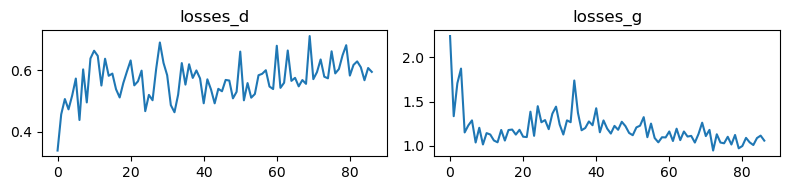

Epoch 87
Time for epoch:  23.134180545806885
Epoch 88
Time for epoch:  22.980671644210815
loss_d=0.56736, loss_g=1.10221
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


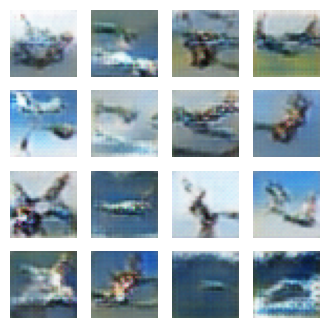

<Figure size 1600x1600 with 0 Axes>

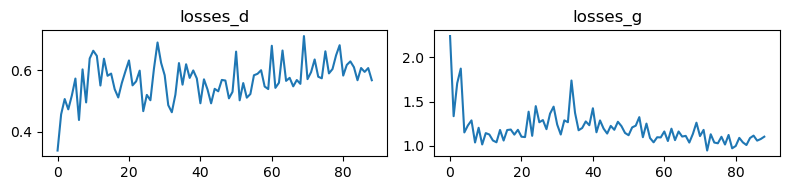

Epoch 89
Time for epoch:  22.98851466178894
Epoch 90
Time for epoch:  22.870310068130493
loss_d=0.60151, loss_g=1.07390
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


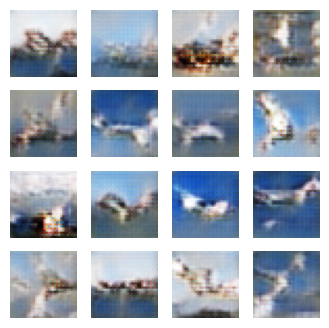

<Figure size 1600x1600 with 0 Axes>

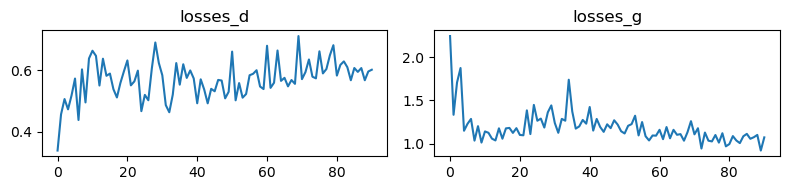

Epoch 91
Time for epoch:  23.202866792678833
Epoch 92
Time for epoch:  22.809573888778687
loss_d=0.60550, loss_g=1.05693
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


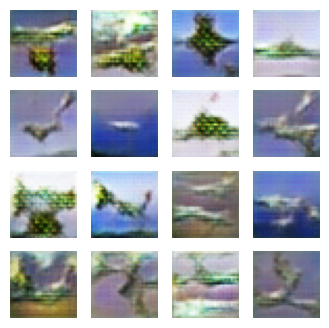

<Figure size 1600x1600 with 0 Axes>

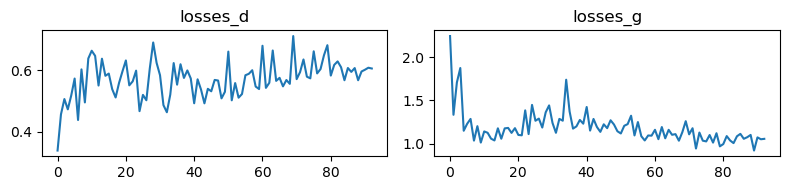

Epoch 93
Time for epoch:  22.954020500183105
Epoch 94
Time for epoch:  22.946030616760254
loss_d=0.59675, loss_g=1.20708
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


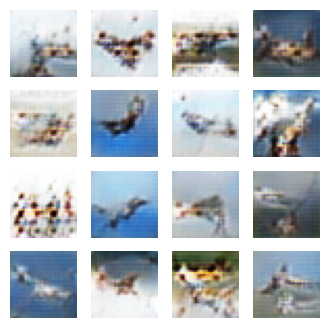

<Figure size 1600x1600 with 0 Axes>

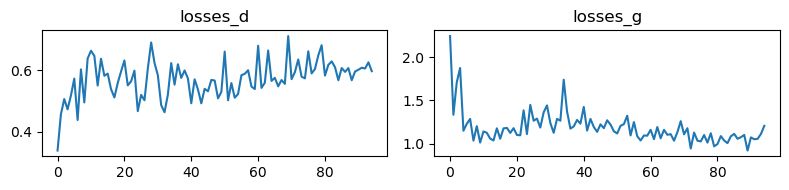

Epoch 95
Time for epoch:  23.037049531936646
Epoch 96
Time for epoch:  22.973167896270752
loss_d=0.55268, loss_g=1.12054
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


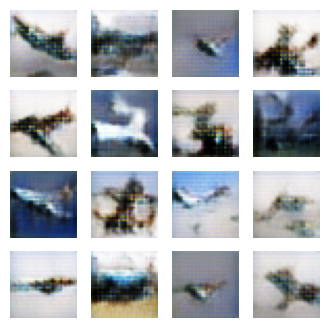

<Figure size 1600x1600 with 0 Axes>

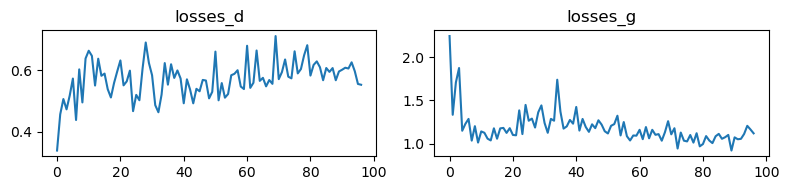

Epoch 97
Time for epoch:  22.82173228263855
Epoch 98
Time for epoch:  22.840662240982056
loss_d=0.61259, loss_g=1.00869
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


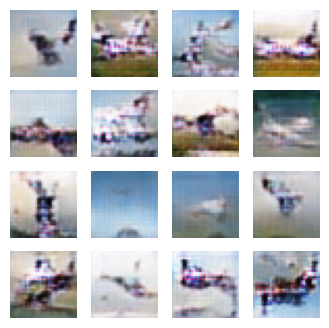

<Figure size 1600x1600 with 0 Axes>

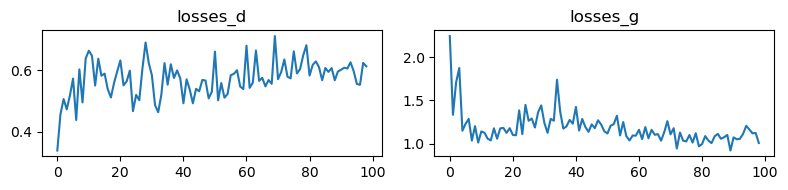

Epoch 99
Time for epoch:  22.887648820877075
Epoch 100
Time for epoch:  22.855684518814087
loss_d=0.49193, loss_g=1.15064
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


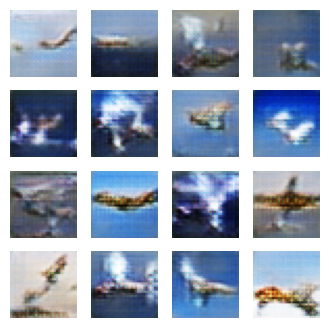

<Figure size 1600x1600 with 0 Axes>

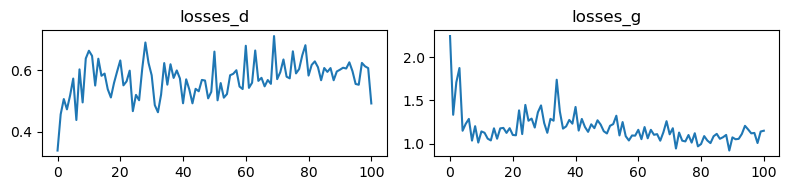

Epoch 101
Time for epoch:  23.281114101409912
Epoch 102
Time for epoch:  22.925230026245117
loss_d=0.56081, loss_g=1.07685
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


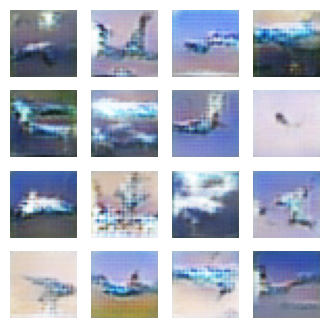

<Figure size 1600x1600 with 0 Axes>

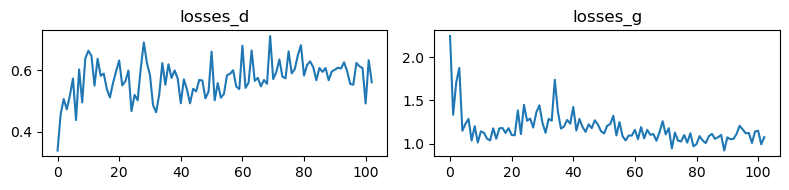

Epoch 103
Time for epoch:  22.95812726020813
Epoch 104
Time for epoch:  22.862639904022217
loss_d=0.57383, loss_g=1.19531
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


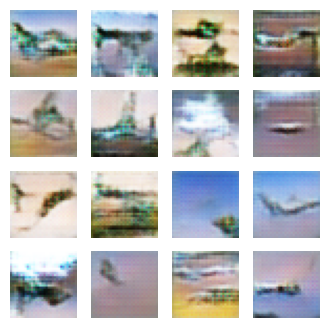

<Figure size 1600x1600 with 0 Axes>

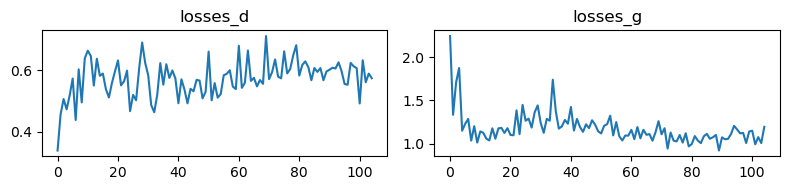

Epoch 105
Time for epoch:  22.95121145248413
Epoch 106
Time for epoch:  23.023257970809937
loss_d=0.59143, loss_g=1.21355
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


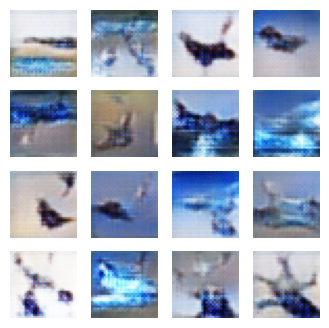

<Figure size 1600x1600 with 0 Axes>

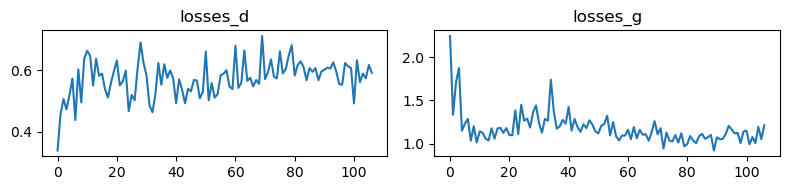

Epoch 107
Time for epoch:  22.93761110305786
Epoch 108
Time for epoch:  22.84697723388672
loss_d=0.62088, loss_g=1.09104
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


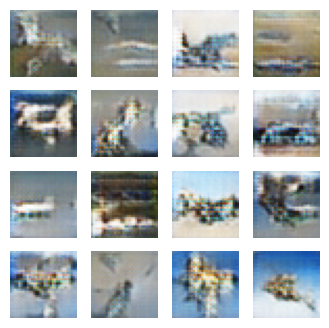

<Figure size 1600x1600 with 0 Axes>

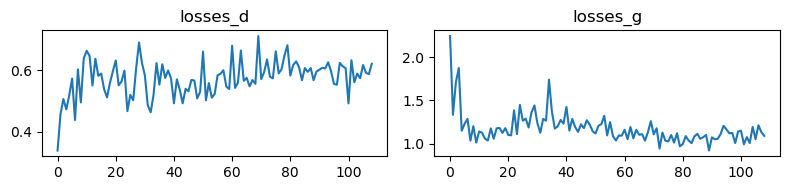

Epoch 109
Time for epoch:  22.946413040161133
Epoch 110
Time for epoch:  22.999040126800537
loss_d=0.54883, loss_g=1.12739
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


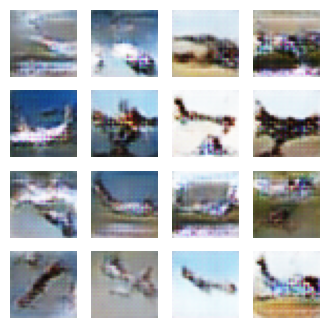

<Figure size 1600x1600 with 0 Axes>

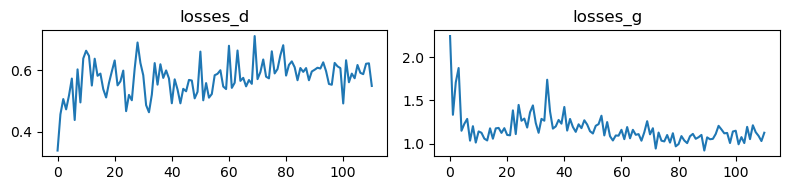

Epoch 111
Time for epoch:  23.06587862968445
Epoch 112
Time for epoch:  22.916422128677368
loss_d=0.55690, loss_g=1.16807
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


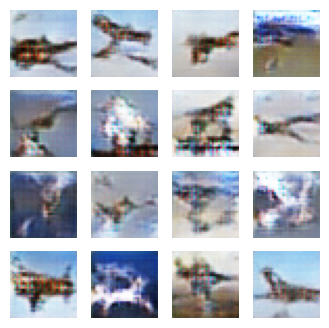

<Figure size 1600x1600 with 0 Axes>

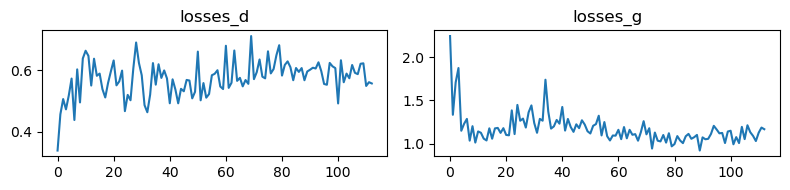

Epoch 113
Time for epoch:  22.96004343032837
Epoch 114
Time for epoch:  23.069029092788696
loss_d=0.54751, loss_g=1.08837
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


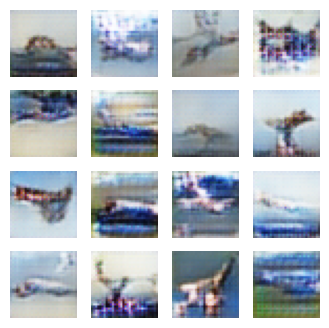

<Figure size 1600x1600 with 0 Axes>

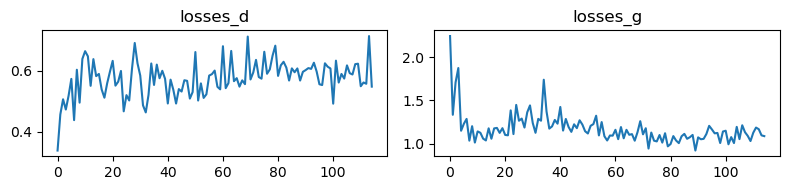

Epoch 115
Time for epoch:  22.99346137046814
Epoch 116
Time for epoch:  23.007415056228638
loss_d=0.59717, loss_g=1.09058
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


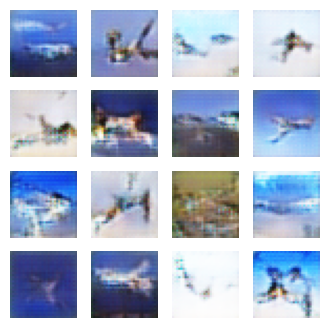

<Figure size 1600x1600 with 0 Axes>

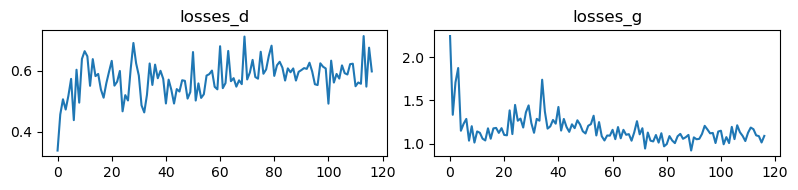

Epoch 117
Time for epoch:  23.034175634384155
Epoch 118
Time for epoch:  23.08468794822693
loss_d=0.60696, loss_g=1.06505
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


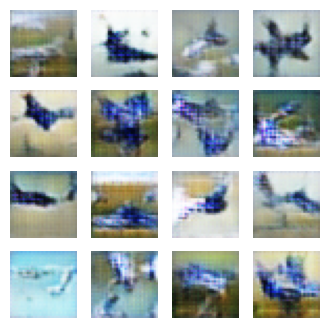

<Figure size 1600x1600 with 0 Axes>

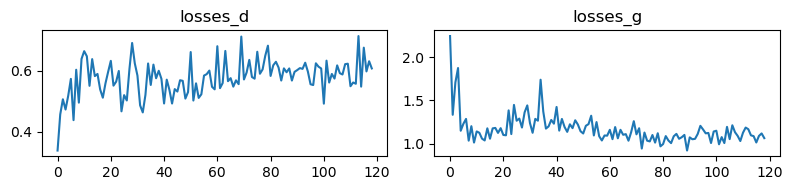

Epoch 119
Time for epoch:  22.919965982437134
Epoch 120
Time for epoch:  22.92339777946472
loss_d=0.61669, loss_g=1.00449
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


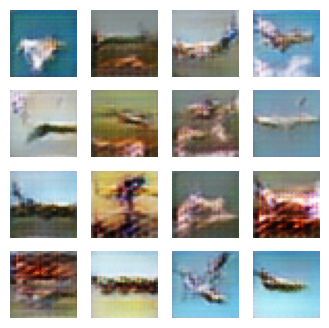

<Figure size 1600x1600 with 0 Axes>

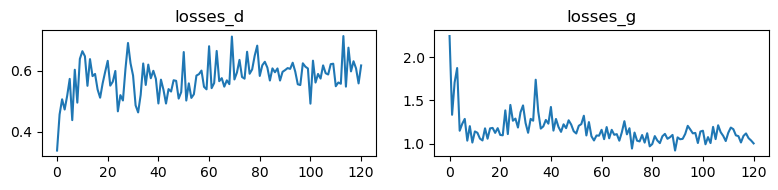

Epoch 121
Time for epoch:  22.91942572593689
Epoch 122
Time for epoch:  23.043323278427124
loss_d=0.52935, loss_g=1.04851
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


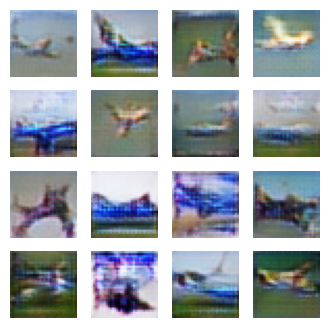

<Figure size 1600x1600 with 0 Axes>

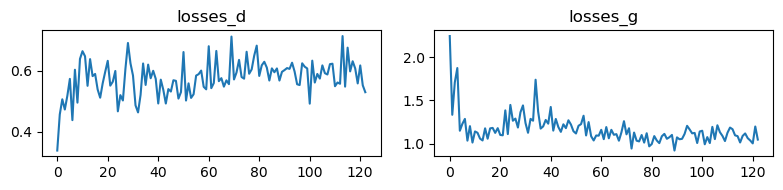

Epoch 123
Time for epoch:  23.384917497634888
Epoch 124
Time for epoch:  23.05442500114441
loss_d=0.42141, loss_g=1.50921
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


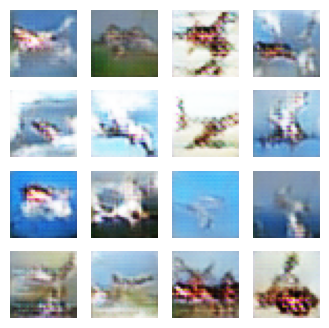

<Figure size 1600x1600 with 0 Axes>

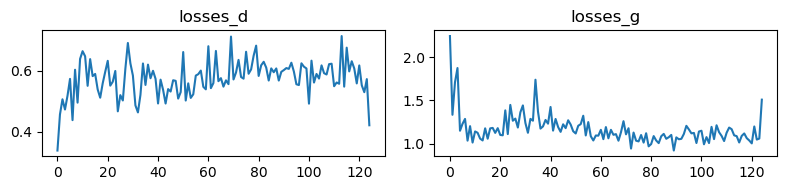

Epoch 125
Time for epoch:  23.04702115058899
Epoch 126
Time for epoch:  22.98242425918579
loss_d=0.65124, loss_g=1.14829
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


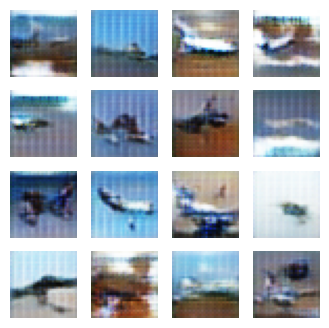

<Figure size 1600x1600 with 0 Axes>

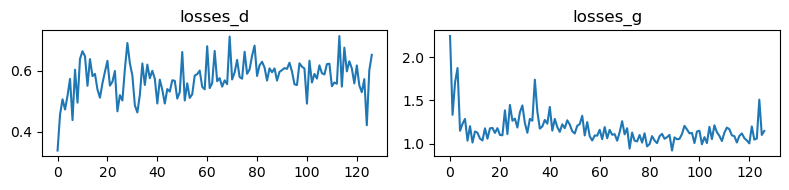

Epoch 127
Time for epoch:  22.994522094726562
Epoch 128
Time for epoch:  23.058082580566406
loss_d=0.56372, loss_g=1.02521
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


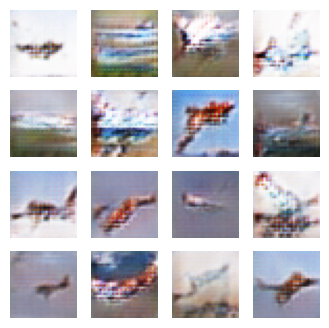

<Figure size 1600x1600 with 0 Axes>

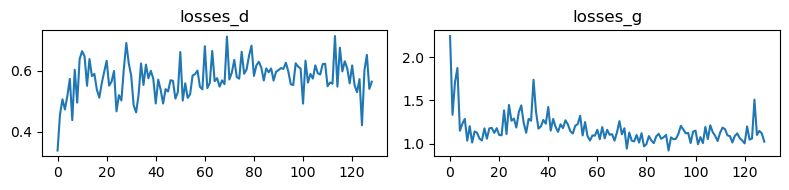

Epoch 129
Time for epoch:  23.024924278259277
Epoch 130
Time for epoch:  22.979535341262817
loss_d=0.58876, loss_g=1.06152
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


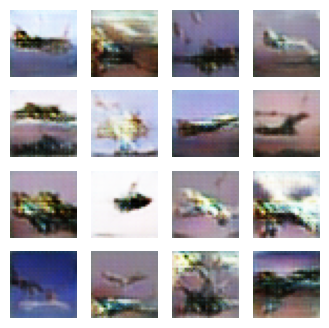

<Figure size 1600x1600 with 0 Axes>

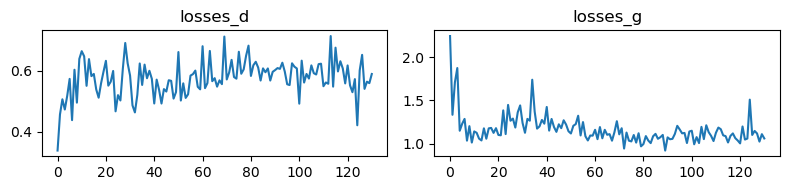

Epoch 131
Time for epoch:  22.9249210357666
Epoch 132
Time for epoch:  23.09562921524048
loss_d=0.69003, loss_g=1.01013
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


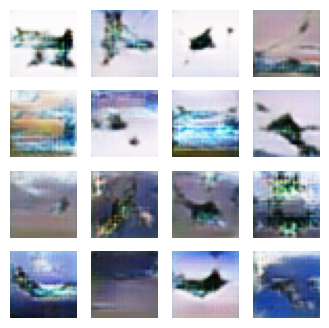

<Figure size 1600x1600 with 0 Axes>

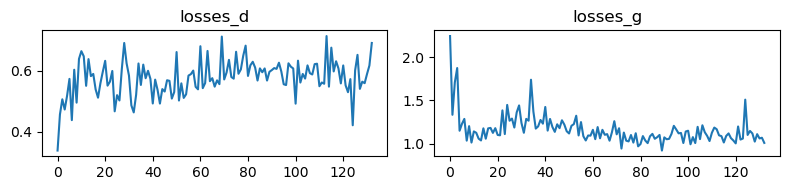

Epoch 133
Time for epoch:  23.110729932785034
Epoch 134
Time for epoch:  22.941302061080933
loss_d=0.53421, loss_g=1.14098
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


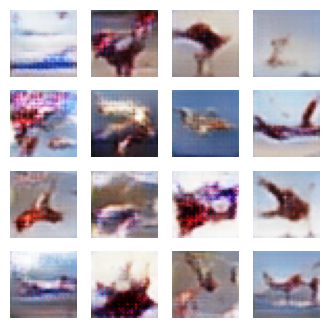

<Figure size 1600x1600 with 0 Axes>

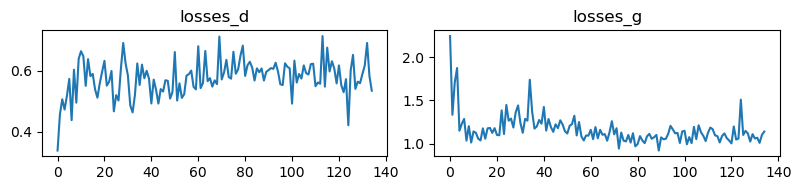

Epoch 135
Time for epoch:  22.977988958358765
Epoch 136
Time for epoch:  23.285402059555054
loss_d=0.58746, loss_g=1.05058
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


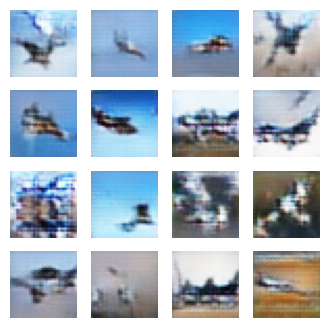

<Figure size 1600x1600 with 0 Axes>

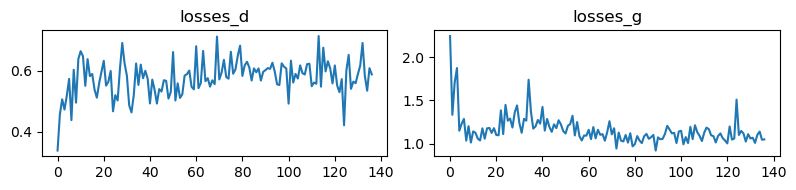

Epoch 137
Time for epoch:  23.033600330352783
Epoch 138
Time for epoch:  22.863102436065674
loss_d=0.60235, loss_g=1.13877
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


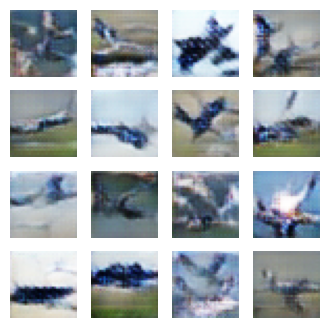

<Figure size 1600x1600 with 0 Axes>

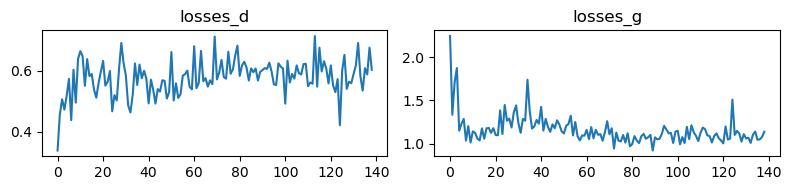

Epoch 139
Time for epoch:  22.94395089149475
Epoch 140
Time for epoch:  22.921773433685303
loss_d=0.56725, loss_g=1.04187
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


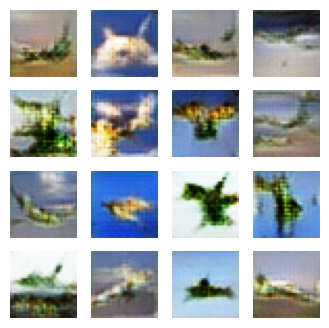

<Figure size 1600x1600 with 0 Axes>

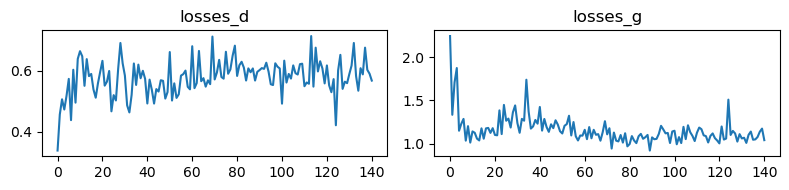

Epoch 141
Time for epoch:  23.042822122573853
Epoch 142
Time for epoch:  23.36455202102661
loss_d=0.61079, loss_g=1.16000
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


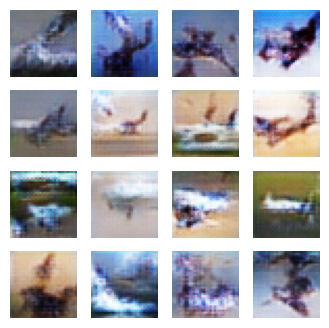

<Figure size 1600x1600 with 0 Axes>

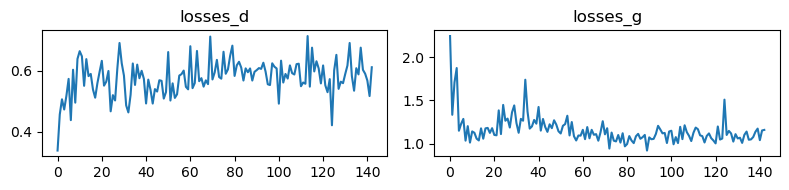

Epoch 143
Time for epoch:  22.954103469848633
Epoch 144
Time for epoch:  22.934333086013794
loss_d=0.59607, loss_g=1.09300
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


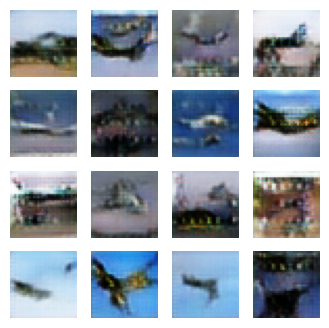

<Figure size 1600x1600 with 0 Axes>

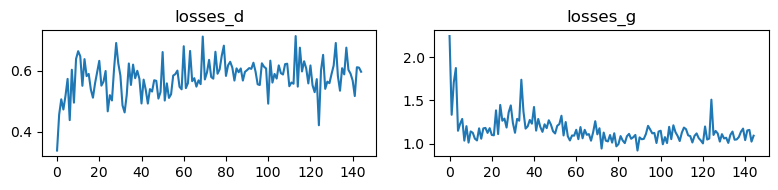

Epoch 145
Time for epoch:  23.167663097381592
Epoch 146
Time for epoch:  22.989810943603516
loss_d=0.63055, loss_g=1.09136
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


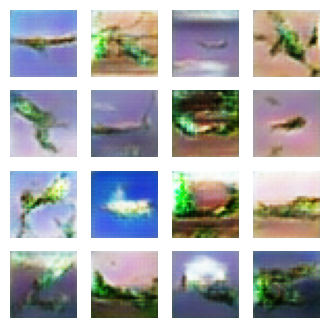

<Figure size 1600x1600 with 0 Axes>

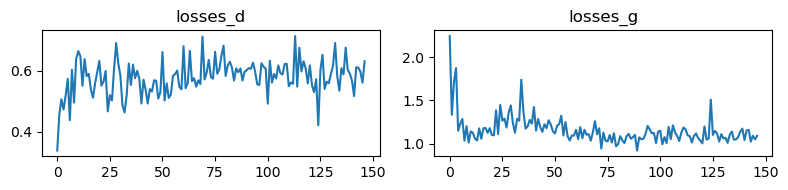

Epoch 147
Time for epoch:  23.145811080932617
Epoch 148
Time for epoch:  23.042938947677612
loss_d=0.58549, loss_g=1.07561
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


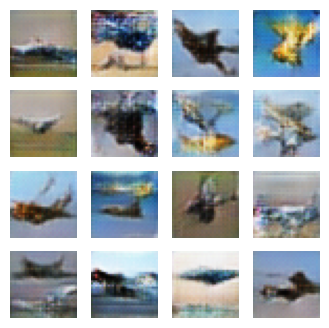

<Figure size 1600x1600 with 0 Axes>

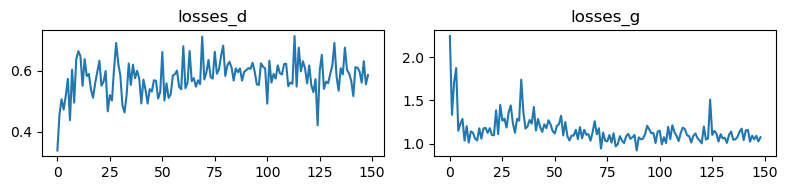

Epoch 149
Time for epoch:  23.104748725891113


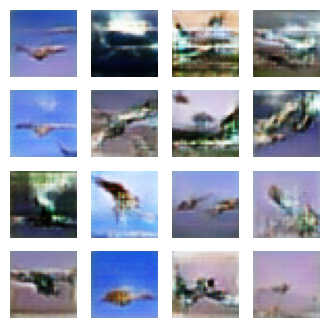

In [5]:
#Training Function
def train(z_dim=100, epochs=150,
          batch_size=16, epoch_per_checkpoint=2, n_checkpoint_images=36):

    #Load the CIFAR10 data
    (X_train, y_train), (X_test, y_test) = cifar10.load_data()
    #Concatenate X_train and X_test for more data
    X_train = np.concatenate((X_train,X_test))
    y_train = np.concatenate((y_train,y_test))
    #Only grab airplanes
    index = np.where(y_train.reshape(-1) == 0)
    X_train = X_train[index]
    y_train = y_train[index]
    #Convert data to floats, Scale data to -1, 1
    X_train = X_train.astype(np.float32)
    X_test = X_test.astype(np.float32)
    X_train = X_train/127.5 - 1.0
    
    
    #Get image shapes and values for reference
    image_shape = X_train[0].shape
    print("image shape {}, min val {}, max val {}".format(image_shape, X_train[0].min(), X_train[0].max()))
    # plot real images for reference
    plot_images(X_train[:n_checkpoint_images], "real_images.png")


    #Get labels for computing the losses
    labels_real = np.ones(shape=(batch_size, 1)) 
    labels_fake = np.zeros(shape=(batch_size, 1))
    #Smooth labels to prevent mode collapse
    labels_real = smooth_positive_labels(labels_real)
    labels_fake = smooth_negative_labels(labels_fake)

    losses_d, losses_g = [], []

    
    # training loop
    for e in range(epochs):
        start = time.time()
        print("Epoch {}".format(e))
        for i in range(len(X_train) // batch_size):

            # update Discriminator weights
            D.trainable = True

            # Get real samples, train discriminator on them
            real_images = X_train[i*batch_size: (i+1)*batch_size]
            #Feed noisy images to discriminator
#             for j in range(batch_size):
#                 real_images[j] = noisy(real_images[j])
            loss_d_real = D.train_on_batch(x=real_images, y=labels_real)[0]

            # Make fake samples, train discriminator on them
            z = generate_latent_points(z_dim, batch_size)
            fake_images = G.predict_on_batch(z)
            #Feed noisy images to discriminator
#             for j in range(batch_size):
#                 fake_images[j] = noisy(fake_images[j])
            loss_d_fake = D.train_on_batch(x=fake_images, y=labels_fake)[0]

            # Compute Discriminator's loss
            loss_d = 0.5 * (loss_d_real + loss_d_fake)

#             # Train the generator while the discriminator is static
#             D.trainable = False
#             loss_g1 = D_of_G.train_on_batch(x=z, y=labels_real)[0]
#             # Update Generator again (train it twice as much as the Discriminator)
#             loss_g2 = D_of_G.train_on_batch(x=z, y=labels_real)[0]
            
#             # Compute Generator's loss
#             loss_g = 0.5 * (loss_g1 + loss_g2)
            # Train the generator while the discriminator is static
            D.trainable = False
            loss_g = D_of_G.train_on_batch(x=z, y=labels_real)[0]

            
        #Keep track of losses for plotting
        losses_d.append(loss_d)
        losses_g.append(loss_g)
        
        end = time.time()
        print("Time for epoch:  " + str(end-start))

        
        #Plot losses and generated images every X epochs
        if (e % epoch_per_checkpoint) == 0:
            print("loss_d={:.5f}, loss_g={:.5f}".format(loss_d, loss_g))
            
            # fix a z vector for training evaluation
            z_fixed = generate_latent_points(z_dim, n_checkpoint_images)
            
            fake_images = G.predict(z_fixed)
            print("\tPlotting images and losses")
            plot_images(fake_images, "fake_images_airplanes_e{}.png".format(e))
            plot_losses(losses_d, losses_g, "losses.png")
            
            #Show Images
            fake_images = (fake_images + 1) * 127.5
            fake_images = np.rint(fake_images)
            fake_images = fake_images.astype(int)

            fig,axs = plt.subplots(4,4,figsize=(4,4),sharey=True,sharex=True)
            cnt=0
            for k in range(4):
                for l in range(4):
                    axs[k, l].imshow(fake_images[cnt,:,:])
                    axs[k, l].axis('off')
                    cnt+=1

            #Save Model every 10 epochs
#             if (e % 10) == 0 and e != 0:
#                 print('Saving Models')
#                 D.save('./DiscriminatorModel')
#                 D_of_G.save('./CombinedModel')
            
            
train()

4/4 [==============================] - 0s 9ms/step


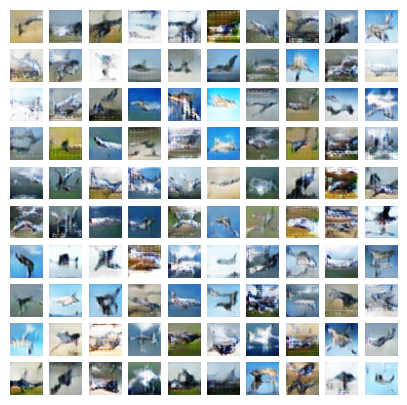

In [6]:
# #Print example images 
n_checkpoint_images = 100
z_dim = 100
#z_fixed = np.random.uniform(-1, 1, size=(n_checkpoint_images, z_dim))
z_fixed = generate_latent_points(z_dim, n_checkpoint_images)
fake_images = G.predict(z_fixed) #Predicted 'images' are (32,32,3) arrays with values -1 to 1
#Convert fake images into actual values for plotting (ints between 0 and 255)
fake_images = (fake_images + 1) * 127.5
fake_images = np.rint(fake_images)
fake_images = fake_images.astype(int)

fig,axs = plt.subplots(10,10,figsize=(5,5),sharey=True,sharex=True)
cnt=0
for k in range(10):
    for l in range(10):
        axs[k, l].imshow(fake_images[cnt,:,:])
        axs[k, l].axis('off')
        cnt+=1

4/4 [==============================] - 0s 9ms/step


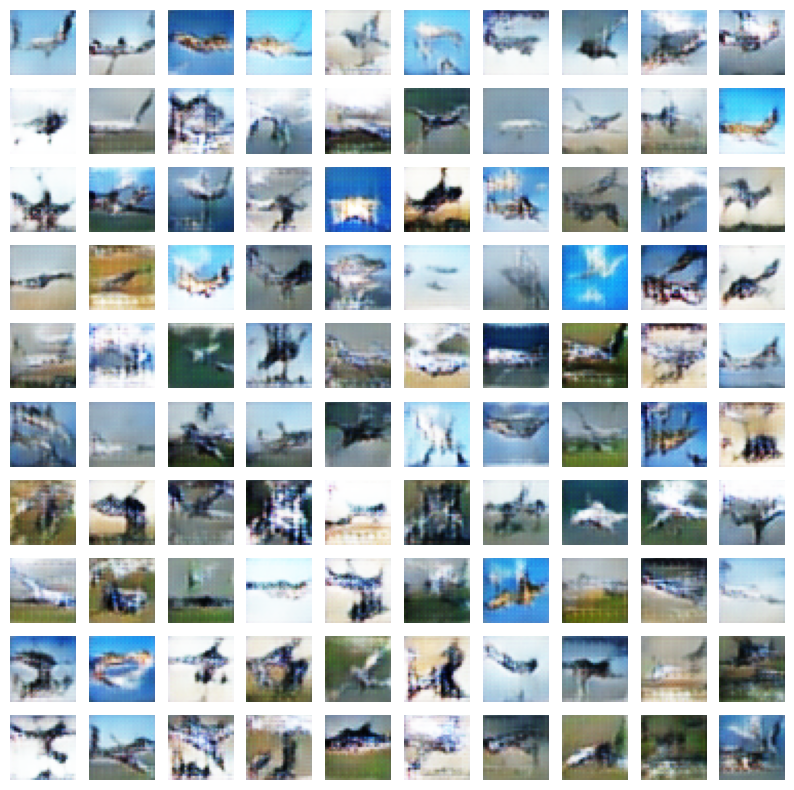

In [7]:
# #Print example images 
#Default Sets, 250 epochs
n_checkpoint_images = 100
z_dim = 100
#z_fixed = np.random.uniform(-1, 1, size=(n_checkpoint_images, z_dim))
z_fixed = generate_latent_points(z_dim, n_checkpoint_images)
fake_images = G.predict(z_fixed) #Predicted 'images' are (32,32,3) arrays with values -1 to 1
#Convert fake images into actual values for plotting (ints between 0 and 255)
fake_images = (fake_images + 1) * 127.5
fake_images = np.rint(fake_images)
fake_images = fake_images.astype(int)

fig,axs = plt.subplots(10,10,figsize=(10,10),sharey=True,sharex=True)
cnt=0
for k in range(10):
    for l in range(10):
        axs[k, l].imshow(fake_images[cnt,:,:])
        axs[k, l].axis('off')
        cnt+=1